# INTRODUCTION
## Sentiment Analysis with Neural Network-Based Multi-Class Classification for Mental Health
__The dataset below provides details about mental health. I am performing sentiment analysis on this dataset to detect the type of mental health issues people are facing based on their statements.__



# DATASET LOCATION:__This dataset was taken from Kaggle from the following link: https://www.kaggle.com/datasets/suchintikasarkar/sentiment-analysis-for-mental-health__



# Information about the Dataset:
1) __Dataset Name: Sentiment Analysis for Mental Health__
2) __Mental Health Status: Normal, Depression, Suicidal, Anxiety, Bipolar, Stress, Personality Disorder.__
3) __Total Number of Statements: 53,000__
4) __Content: Includes people's statements about their mental health and their diagnosed status.__


# Business Problem Statement:
__A small town in Germany is struggling with poor mental health care facilities. As a result, a company wants to capitalize on this opportunity by investing in the development of cutting-edge technology that can easily identify or predict the type of mental health problem each individual is facing. This approach aims to reduce costs associated with constructing mental health clinics, as well as minimizing labor and investment costs.__

__The company plans to monetize the technology by charging a subscription fee to individuals who wish to receive a diagnosis through this system. To implement this technology, the company has decided to use a deep dense neural network to perform sentiment analysis on the dataset and predict the type of mental health issues people may suffer from.__    


# Main Objective:
__The main objective is to achieve better prediction accuracy, enabling the provision of precise medication tailored to the patient's needs.__  

_Importing all the vital libraries_

In [9]:
import numpy as np
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
import tensorflow as tf
import seaborn as sns
import os
from sklearn.feature_extraction.text import TfidfTransformer
import plotly.express as px
from wordcloud import WordCloud
from nltk.tokenize import RegexpTokenizer
import nltk
from nltk.corpus import stopwords
from sklearn.preprocessing import LabelEncoder
from nltk.stem import PorterStemmer
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
import array
from keras.models import Sequential
from tensorflow.keras.layers import Dropout, Dense
import json
from keras_tuner.engine.hyperparameters import HyperParameters
from IPython.display import Image
from tensorflow.keras import layers, models
from keras_tuner import RandomSearch
from tensorflow import keras
import keras_tuner as kk
from tensorflow.keras.preprocessing.sequence import pad_sequences
from IPython.display import display
import glob
from sklearn.feature_extraction.text import CountVectorizer



_Reading the data_

In [2]:
health = pd.read_csv(r"D:\archive (2)\Combined Data.csv",index_col = 0)
health.sample(5)

,statement,status
33283,what's wrong?,Normal
19724,"I just want to quit. I know I cannot, but I wa...",Depression
23283,Being 'loved' or 'cared for' is just a giant s...,Suicidal
43604,being grumpy abu dhabi is so boring there real...,Normal
25769,"really looking for a reason to stay rn, i was ...",Suicidal


_Shuffling in order to prevent overfitting and helps the model to learn generalizable patterns_

In [3]:
health = health.sample(frac=1, random_state=120)
health.reset_index(drop=True, inplace=True)


In [4]:
health.shape


(53043, 2)

_Removing missing values_

In [5]:
health.dropna(inplace = True)
health.shape

(52681, 2)

_Balancing the dataset_

In [6]:
health.status.value_counts()


status
Normal                  16343
Depression              15404
Suicidal                10652
Anxiety                  3841
Bipolar                  2777
Stress                   2587
Personality disorder     1077
Name: count, dtype: int64

_Plotting the counts of the statements and their statuses in a graph to visualize the data distribution_


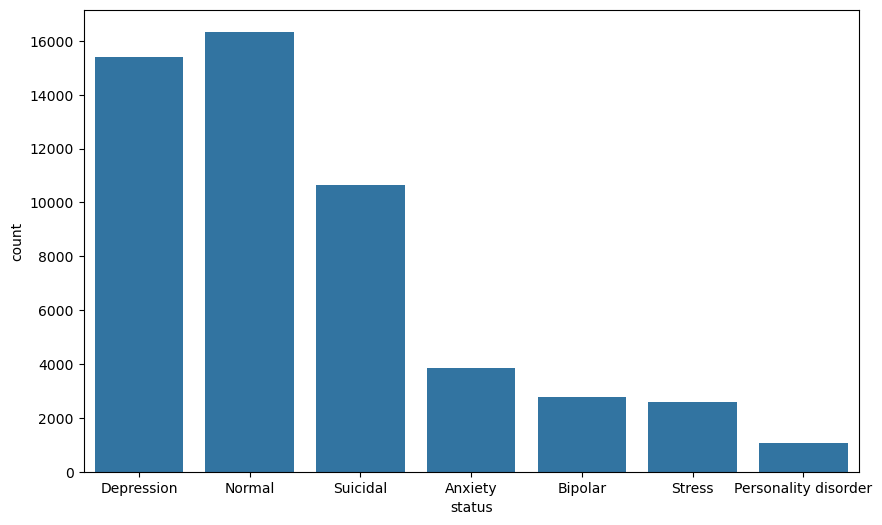

In [7]:
plt.figure(figsize=(10, 6))
sns.countplot(data=health, x='status')
plt.show()


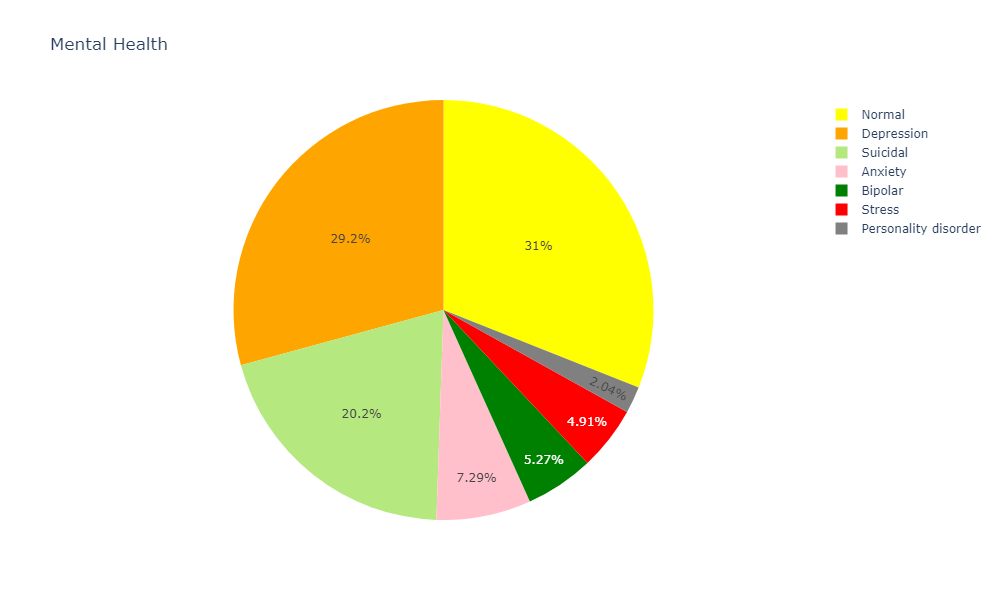

In [12]:
choice_of_colours = {
    'Normal': 'yellow',  
    'Bipolar': 'Green',
    'Depression': 'orange',
    'Suicidal status': 'blue',
    'Stress': 'red',
    'Personality disorder': 'grey',
    'Anxiety': 'pink'
}

pie = px.pie(
    health,
    names='status',
    color='status',  
    color_discrete_map=choice_of_colours,
    labels={'status': 'Status'},  
    title='Mental Health',
    width=1000,  
    height=600   
)
image_filen = "mental.png"
pie.write_image(image_filen)

Image(image_filen)


_Word clouds for the statements of each status_

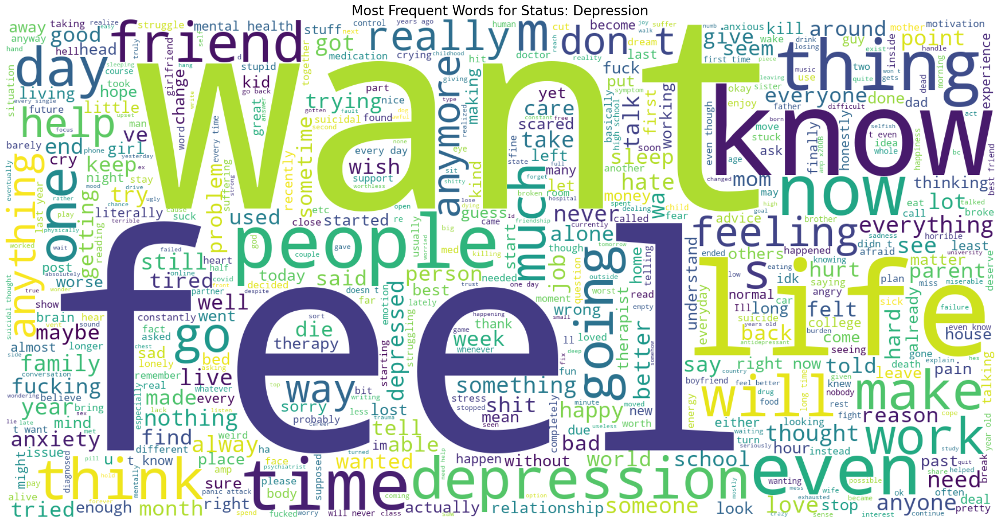

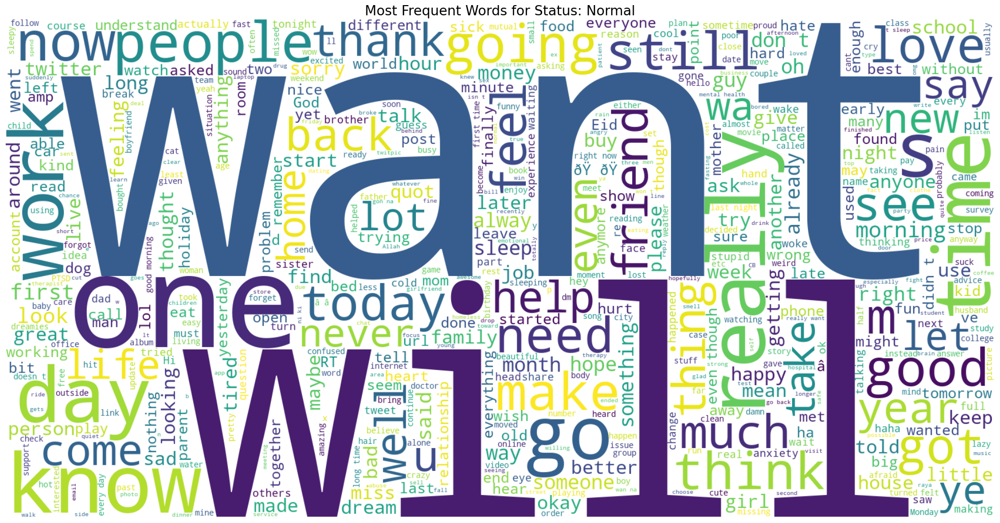

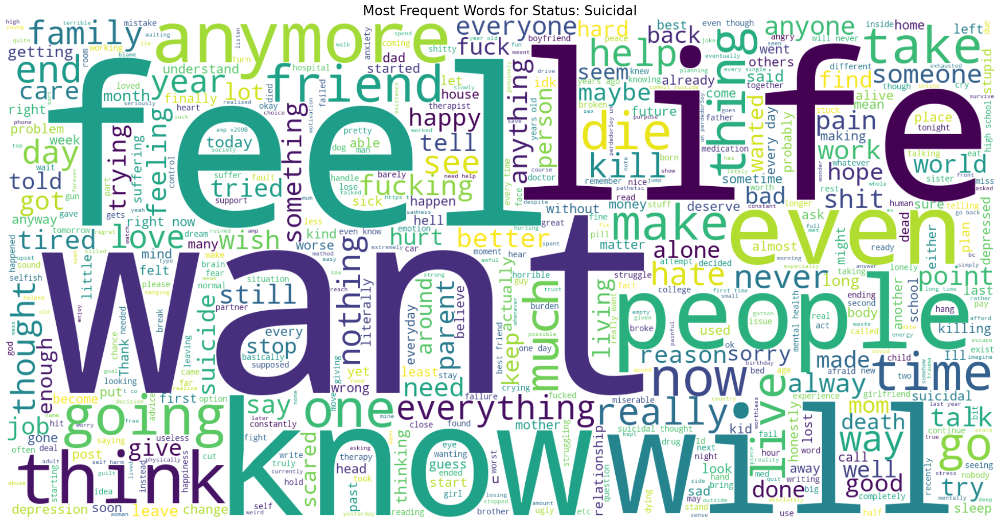

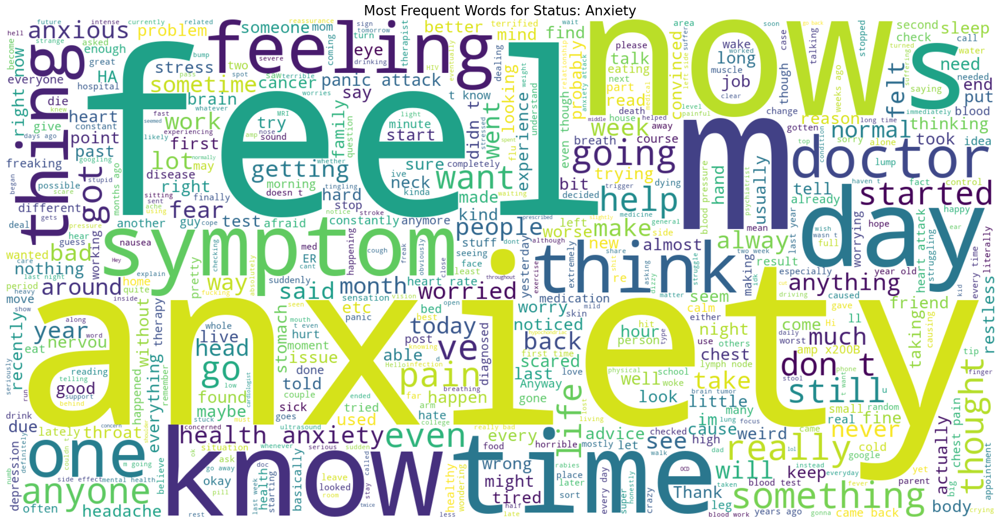

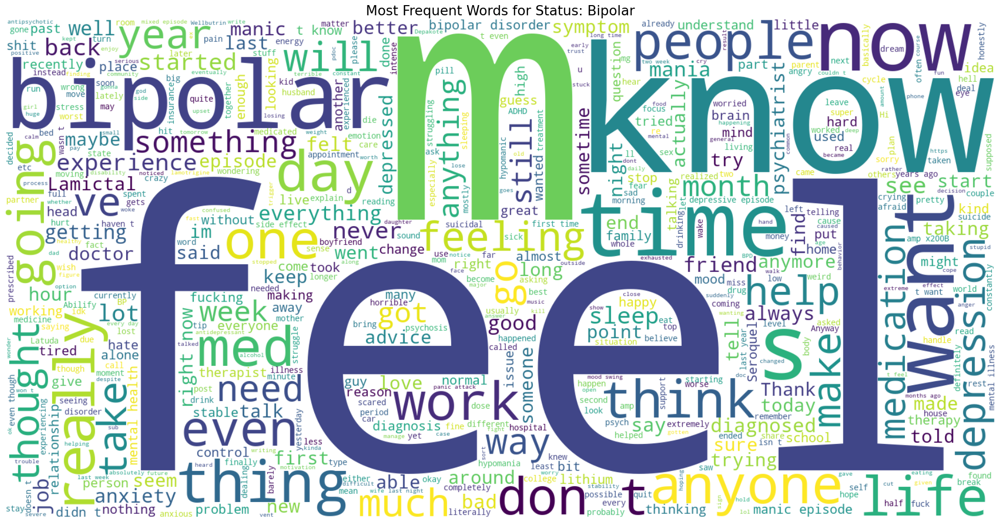

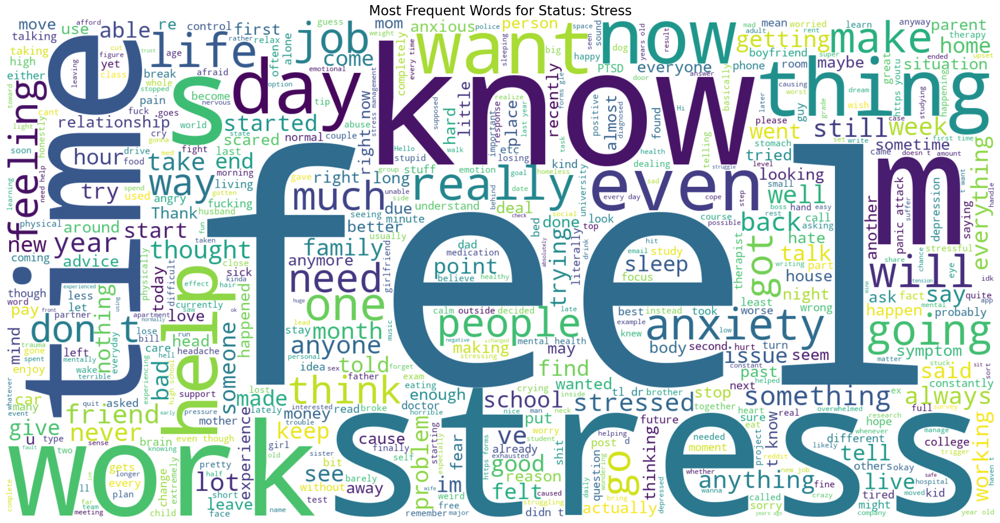

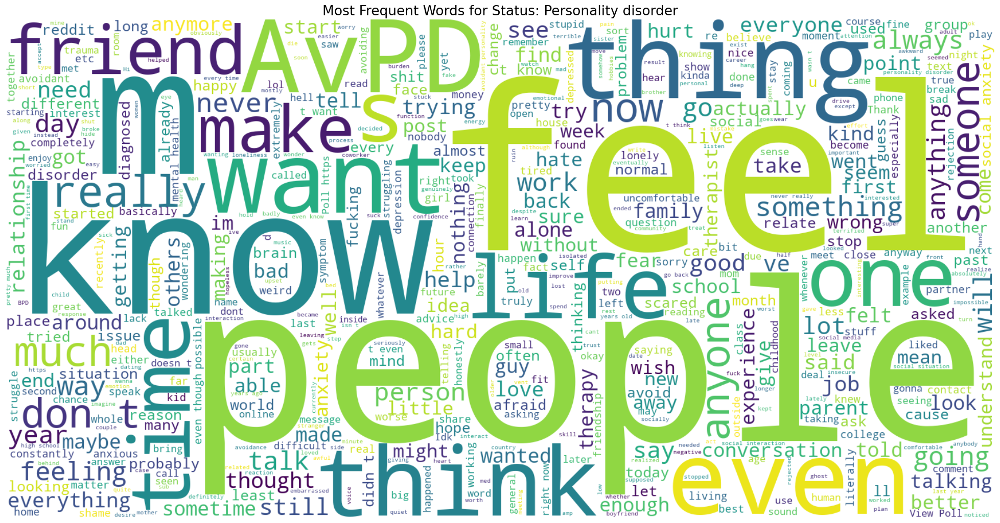

In [11]:

for u in health['status'].unique():
    cloudin_datas = health[health['status'] == u]
    dte_ = ' '.join(cloudin_datas['statement']) 
    
    plt.figure(figsize=(10, 15))
    wo_cloud_stament = WordCloud(max_words=433, width=1501, height=701, background_color='white').generate(dte)
    plt.imshow(wo_cloud_stament, interpolation='bicubic')
    plt.axis("off")
    plt.title(f'Most Frequent Words for Status: {u}', fontsize=19)
    plt.show()

          

                                  

_Text Preprocessing_


_Here, we are lowering the text, removing punctuation, stopwords, cleaning the text, and handling special characters._

In [30]:
p_ss = PorterStemmer()
punctuation = RegexpTokenizer(r'\w+')    

def cleaning_the_text_statment(te):
    
     p_uc = punctuation.tokenize(te)
     stops_wordses_statement = set(stopwords.words('english')) 
     w_ords = [caa for caa in p_uc if not caa in stops_wordses_statement]
     stemmed_words_statment = "  ".join([p_ss.stem(word) for word in w_ords])

     return stemmed_words_statment

lower = health['statement'].str.lower()
health['revised_statement'] = lower.apply(cleaning_the_text_statment)
       

In [31]:
health['revised_statement'].head()

0    titl  say  feel  like  one  hyper  alot  atten...
1         blacken  sky  encroach  tug  behind  depress
2    give  insomnia  turn  make  depress  wors  day...
3    hello  new  submitt  channel  went  night  ago...
4                                  thank  god  cb  eid
Name: revised_statement, dtype: object

_Splitting the text into X [features] and y [labels]._

In [32]:
x = health['revised_statement'].values
y = health['status'].values

_Using the scikit-learn train_test_split library, here we split our data to train and test._ 

In [33]:
X_train_s, X_test_s, Y_train_s, Y_test_s = train_test_split(x, y, test_size = 0.2, random_state = 42)

_Encoding our labels after split to avoid data leakage._

In [34]:
label_encod_y = LabelEncoder()
Y_train_sco = label_encod_y.fit_transform(Y_train_s)
Y_test_sco = label_encod_y.transform(Y_test_s)

In [35]:
y_train_cat = to_categorical(Y_train_sco)
y_test_cat = to_categorical(Y_test_sco)

In [36]:
print(len(X_train_s), len(X_test_s))

42144 10537


_We are using CountVectorizer because it allows our machine learning model to process the data numerically by transforming it into a sparse matrix of word frequencies._

In [37]:
cvector = CountVectorizer(max_features = 15000,max_df = 0.6)
X_train_tor = CountVectorizer(max_df = 0.5, max_features = 15000).fit_transform(X_train_s)  
X_test_tor = CountVectorizer(max_df = 0.5, max_features = 15000).transform(X_test_s)        



In [38]:
X_train_tor.shape

(42144, 15000)

In [39]:
X_test_tor.shape

(10537, 15000)

_Here, we use TfidfTransformer to convert raw word counts into TF-IDF values, which emphasize important terms in a document while downweighting commonly occurring words across all documents._

In [40]:
t_fid_tr = TfidfTransformer()
X_train_tf = t_fid_tr.fit_transform(X_train_tor)  
X_test_tf = t_fid_tr.transform(X_test_tor)       


In [42]:
print(X_train_tf[:3])

  (0, 13063)	0.525247730752705
  (0, 11369)	0.7429860864406294
  (0, 5031)	0.4148330949849246
  (1, 10553)	0.32519512340181544
  (1, 8146)	0.7071655493269272
  (1, 6330)	0.6278256267155901
  (2, 12560)	0.625664128492506
  (2, 6359)	0.7800925575325744


_Converting the data to arrays because neural networks expect dense arrays to perform computations._

In [78]:
X_train = np.array(X_train_tf)
X_test = np.array(X_test_tf)
print(type(X_train))

<class 'numpy.ndarray'>


# Constructing the Neural Network Model:
__Here are the hyperparameters we are working with:__
1) Units
2) Dropout
3) Learning rate
4) Activations functions
We experiment with different values of these hyperparameters to achieve a well-performing model. To do this, we use Keras Tuner.

************
# Keras Tuner:
__Keras Tuner helps to search for the best hyperparameter values to achieve good accuracy for the model.__

__We do this in the following way:__   

1) In the model, we store different values for each hyperparameter in the model definition..
2) We define a search space by specifying the different ranges of values for each hyperparameter.
3) The tuner will select different combinations of values from each hyperparameter and train the model. It’s like an experiment.
4) Finally, the tuner will return the best model that has good accuracy on both training and validation data.



In [49]:
def powerfull_enn(en):
    neurons = en.Choice('num_units', values=[64, 128, 256,512], default=128)
    alpha_r = en.Choice('learning_rate', values=[1e-3, 1e-4, 1e-5, 1e-6])
    diiferent_activations = en.Choice("activation", ["relu", "tanh", "sigmoid"])
    different_droput_values = en.Choice('dropout', values=[0.25, 0.35, 0.5])

    ffnne = Sequential()
    ffnne.add(layers.Dense(neurons, activation=diiferent_activations, input_shape=(X_train.shape[1],)))
    ffnne.add(Dropout(rate=different_droput_values))
    ffnne.add(layers.Dense(neurons, activation=diiferent_activations))
    ffnne.add(Dropout(rate=different_droput_values))

    san = 'softmax'
    ffnne.add(Dense(y_train_cat.shape[1], activation=san))  
    
    
    ffnne.compile(
                  loss=keras.losses.CategoricalCrossentropy(),
                  optimizer=keras.optimizers.Adam(learning_rate=alpha_r),
                  metrics=['accuracy']
    )
    
    return ffnne



_This performs hypertuning_



In [50]:
rotate = kk.Hyperband(powerfull_enn, 
                   objective='val_accuracy', 
                   seed=5, 
                   objective='val_accuracy', 
                   project_name='mental_health',
                   max_epochs=15, 
                   overwrite=True, 
                   directory='santos', 

)

_We use early stopping to terminate a trial or training process if the metric stagnates at the same level for 6 epochs. This will stop after 6 epochs if there is not much improvement in validation loss for the last 6 epoch._



In [51]:
stoop_ea = tf.keras.callbacks.EarlyStopping(patience=6,
                                              min_delta=0.001,
                                              monitor='val_loss',
                                              verbose=1,
                                              baseline = None
)


_Here tuner running hyperparamter search_



In [54]:
rotate.search(epochs=15, 
              callbacks=[stoop_ea],
              X_train,
              y_train_cat,
              validation_split=0.2,
              verbose=1)


Trial 30 Complete [00h 07m 45s]
val_accuracy: 0.3038319945335388

Best val_accuracy So Far: 0.7471823692321777
Total elapsed time: 01h 11m 44s


_We got summary of all the trials with different combination values of hyperparameters with their accuracy._



In [55]:
rotate.results_summary()


Results summary
Results in santos\mental_health
Showing 10 best trials
Objective(name="val_accuracy", direction="max")

Trial 0019 summary
Hyperparameters:
num_units: 64
dropout: 0.35
learning_rate: 0.001
activation: relu
tuner/epochs: 5
tuner/initial_epoch: 0
tuner/bracket: 1
tuner/round: 0
Score: 0.7471823692321777

Trial 0006 summary
Hyperparameters:
num_units: 256
dropout: 0.35
learning_rate: 0.001
activation: relu
tuner/epochs: 2
tuner/initial_epoch: 0
tuner/bracket: 2
tuner/round: 0
Score: 0.7462332248687744

Trial 0021 summary
Hyperparameters:
num_units: 512
dropout: 0.5
learning_rate: 0.001
activation: relu
tuner/epochs: 5
tuner/initial_epoch: 0
tuner/bracket: 1
tuner/round: 0
Score: 0.7462332248687744

Trial 0015 summary
Hyperparameters:
num_units: 128
dropout: 0.35
learning_rate: 0.0001
activation: tanh
tuner/epochs: 5
tuner/initial_epoch: 2
tuner/bracket: 2
tuner/round: 1
tuner/trial_id: 0001
Score: 0.7456400394439697

Trial 0008 summary
Hyperparameters:
num_units: 256
dropo

_Add those experiments into a DataFrame. IPython display is used because it formats objects within the DataFrame in a visually professional and structured manner._



In [67]:
def load_json_files(root_directory):
    json_files = glob.glob(root_directory + '/**/*.json', recursive=True)
    return [file for file in json_files if file.endswith('trial.json')]

def extract_data(json_files):
    data = []
    for file in json_files:
        with open(file, 'r') as f:
            trial_data = json.load(f)
            data.append({
                **{key: trial_data['metrics']['metrics'][key]['observations'][0]['value'] for key in ['val_accuracy', 'accuracy', 'val_loss', 'loss']},
                **{key: trial_data['hyperparameters']['values'][key] for key in ['dropout', 'learning_rate','activation','num_units']}
            })
    return data

def create_dataframe(data):
    return pd.DataFrame(data)

root_directory = 'santos/mental_health'
json_files = load_json_files(root_directory)
data = extract_data(json_files)
df = create_dataframe(data)

display(df)

,val_accuracy,accuracy,val_loss,loss,dropout,learning_rate,activation,num_units
0,[0.6959307193756104],[0.6704730987548828],[0.8163484334945679],[0.885347843170166],0.50,0.000100,relu,256
1,[0.7066081166267395],[0.6920955181121826],[0.7908949255943298],[0.8432548642158508],0.35,0.000100,tanh,128
2,[0.4013524651527405],[0.3584161400794983],[1.9189811944961548],[1.925315260887146],0.25,0.000001,tanh,128
3,[0.3038319945335388],[0.25249889492988586],[1.6317267417907715],[1.7937566041946411],0.25,0.000010,sigmoid,256
4,[0.28876498341560364],[0.15224677324295044],[2.0672659873962402],[2.2930471897125244],0.50,0.000001,sigmoid,64
5,[0.4499940574169159],[0.3022986948490143],[1.8981128931045532],[1.9265516996383667],0.50,0.000010,relu,128
6,[0.7462332248687744],[0.6922141313552856],[0.668554961681366],[0.8246467709541321],0.35,0.001000,relu,256
7,[0.47822991013526917],[0.3690938651561737],[1.5808111429214478],[1.6604887247085571],0.35,0.000010,relu,256
8,[0.7446909546852112],[0.7082901000976562],[0.6780351400375366],[0.7893975973129272],0.35,0.001000,tanh,256
9,[0.7410131692886353],[0.6984724998474121],[0.689310610294342],[0.8232159614562988],0.35,0.001000,tanh,128


_This is a vital step because we are evaluating our best model parameters on the test dataset to obtain test accuracy, which provides an honest measure since the model is evaluated on unseen data._



In [70]:
ffnne = powerfull_enn(rotate.get_best_hyperparameters(1)[0])
ffnne.fit(X_test, y_test_cat, epochs=15)

C:\Users\santos\Downloads\es\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/15
330/330 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - accuracy: 0.3912 - loss: 1.5726
Epoch 2/15
330/330 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.6868 - loss: 0.8306
Epoch 3/15
330/330 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.8117 - loss: 0.5585
Epoch 4/15
330/330 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.8585 - loss: 0.4230
Epoch 5/15
330/330 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9091 - loss: 0.2928
Epoch 6/15
330/330 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.9334 - loss: 0.2179
Epoch 7/15
330/330 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9462 - loss: 0.1750
Epoch 8/15
330/330 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.9610 - loss: 0.1325
Epoch 9/15
330/330 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.9719 - loss: 0.1030
Epoch 10/15
330/330 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.9772 - loss: 0.0855
Epoch 11/15
330/330 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.9765 - loss: 0.0787
Epoch 12/15
330/330 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step

In Conclusion:

PROS:

* Created neural network model that we buid for mental health sentimental analysis did a fantastic job. It acheived 0.74% on validation and 98% accuracy on the test dataset.
* This systematic approach significantly contributed to achieving better metrics on the unseen test dataset.
*  This implementation helps the company generate significant revenue while also addressing the mental health problem in the small town in Germany. Additionally, it reduces labor costs and minimizes human error.                                                                   


CONS:

* One limitation of the proposed implementation is that the statements (text) should contain more details, allowing us to capture even deeper patterns.
* The dataset has a smaller number of training samples from certain classes. Therefore, more textual data is needed for these classes to improve the model's real-time performance.
 